**Note:** I'll be very happy to accept suggestions to make this more lucid for the readers to understand. Anyone seeing this, having a suggestion in mind, please leave a message at my 

1. linkedin profile: www.linkedin.com/in/pratik-karmakar-271a89148
or
2. email : pkpratikkarmakar@gmail.com

# Fourier Transform

## Motivation:
The motivation behind fourier transform or series is to find out the different frequency components that are constructing a signal and find their amount of contribution to the construction of that particular signal. The signals can be temporal or spatial in nature and both will be converted into frequency domain using fourier transform.

Let's say, we have a function $$f(t)=5\sin(t)+2\sin(2t)+6\sin(3t)$$
We can clearly see that there are 3 sinusoids of 3 different frequencies that are making up the function. The first component has frequency 1, amplitude 5, the second has frequency 2, amplitude 2 and the third has frequency 3 and amplitude 6.

We'll have a look at each of these components individually and the function as a whole:

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2

from mpl_toolkits.mplot3d import axes3d
from matplotlib import cm
import matplotlib.animation as animation
from IPython.display import HTML, display
from matplotlib.animation import FuncAnimation

%matplotlib inline

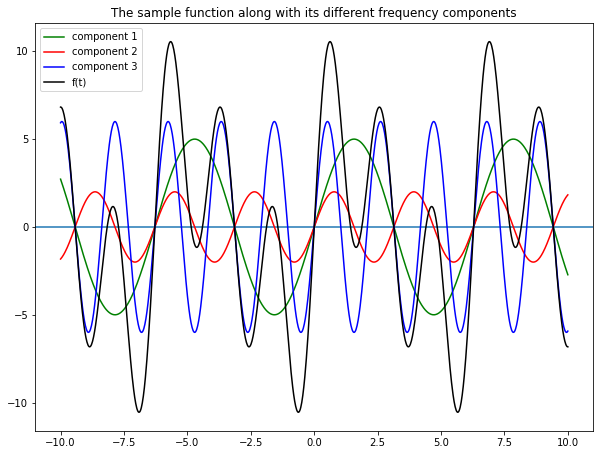

In [2]:
def f(t):
    return (5*np.sin(t)+2*np.sin(2*t)+6*np.sin(3*t))
T=np.linspace(-10,10,1000)

F=[f(t) for t in T]

plt.figure(figsize=(10,7.5))
plt.axhline(y=0, linestyle='-')
plt.plot(T,5*np.sin(T),"green",label="component 1")
plt.plot(T,2*np.sin(2*T),"red",label="component 2")
plt.plot(T,6*np.sin(3*T),"#0000ff",label="component 3")
plt.plot(T,F,"k",label="f(t)")
plt.title("The sample function along with its different frequency components")
plt.legend()
plt.show()

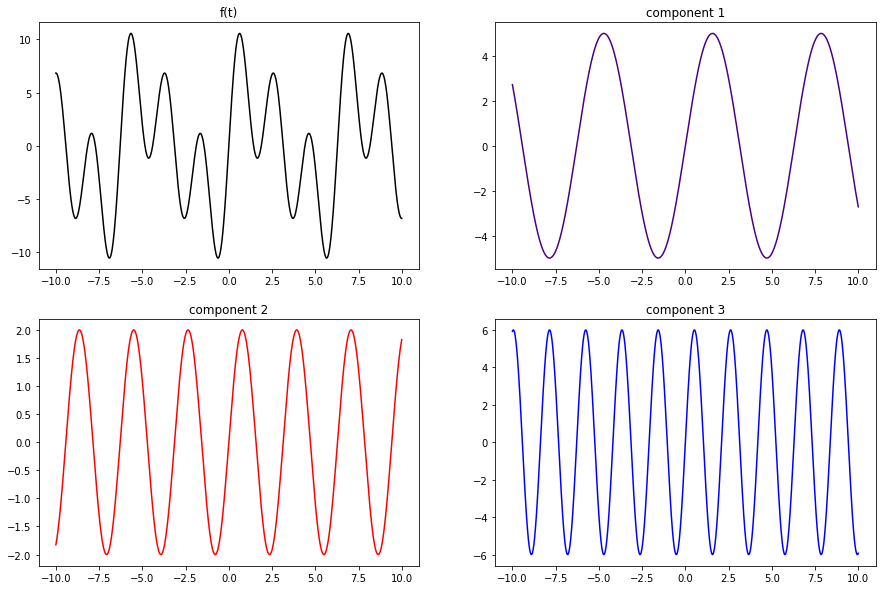

In [3]:
plt.figure(figsize=(15,10))
plt.subplot(221)
plt.plot(T,F,"k")
plt.title("f(t)")
plt.subplot(222)
plt.plot(T,5*np.sin(T),"indigo",label="component 1")
plt.title("component 1")
plt.subplot(223)
plt.plot(T,2*np.sin(2*T),"red",label="component 2")
plt.title("component 2")
plt.subplot(224)
plt.plot(T,6*np.sin(3*T),"blue")
plt.title("component 3")
plt.show()

In the above figures we see the original signal and its components. We see that different frequency components have different amplitudes. This implies that the components have different level of contribution in forming the function. Also, we'll see the difference in contribution of the different components in the power spectrum of this function.

Let's take a big leap and say, every signal can be formed by some (or infinitely many) sinusoids of various amplitudes and phases. Seems absurd, right? Let's have a look at some very familiar functions.

1. Rectangular wave function
2. Triangular wave function

(Both are periodic functions)

#### 1. Rectangular wave function

Shown below is a rectangular wave of period 2s:

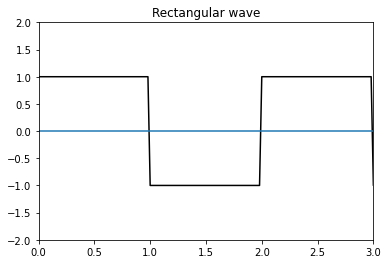

In [4]:
from scipy import signal

t = np.linspace(0, 100, 5000, endpoint=False)
plt.plot(t, signal.square(np.pi*t),"k")
plt.ylim(-2, 2)
plt.xlim(0,3)
plt.axhline(y=0)
plt.title("Rectangular wave")
plt.show()

Now let's try to form this function with sinusoids:

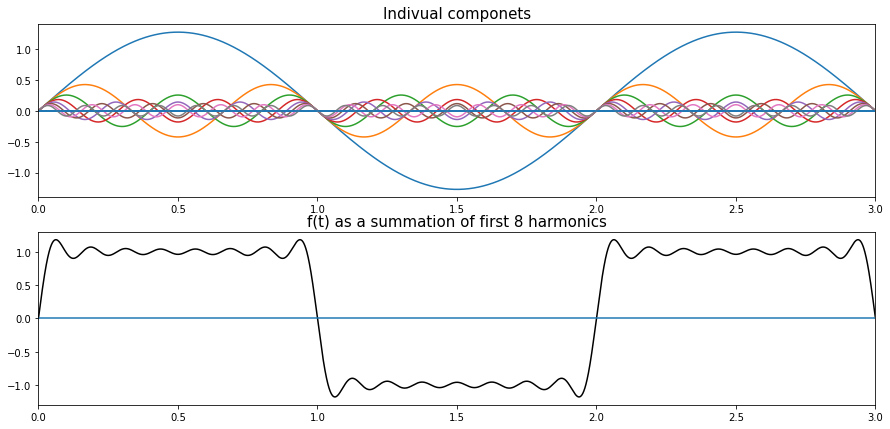

In [5]:
t1=np.linspace(0,100,500000)

f=[]
for i in range(8):
    f.append([])
    for t in t1:
        f[i].append(4*np.sin((2*i+1)*np.pi*t)/((2*i+1)*np.pi))

plt.figure(figsize=(15,7))
plt.subplot(211)
for i in range(8):
    plt.plot(t1,f[i])
    plt.axhline(y=0)
    plt.xlim(0,3)
plt.title("Indivual componets",fontsize=15)

fn=f[0]
for i in range(1,8):
    fn=np.add(fn,f[i])

plt.subplot(212)    
plt.plot(t1,fn,"k")
plt.axhline(y=0)
plt.xlim(0,3)
plt.title("f(t) as a summation of first 8 harmonics",fontsize=15)
plt.show()

#### 2. Triangular wave function (or Sawtooth wave)
Shown below is a triangular wave (sawtooth wave) of period 2s

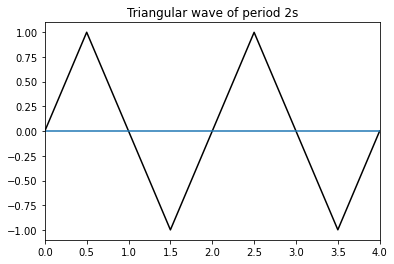

In [6]:
t=np.linspace(0,50,5000)
plt.plot(t,signal.sawtooth(np.pi*(t+0.5),width=0.5),"k")
plt.xlim(0,4)
plt.axhline(y=0)
plt.title("Triangular wave of period 2s")
plt.show()

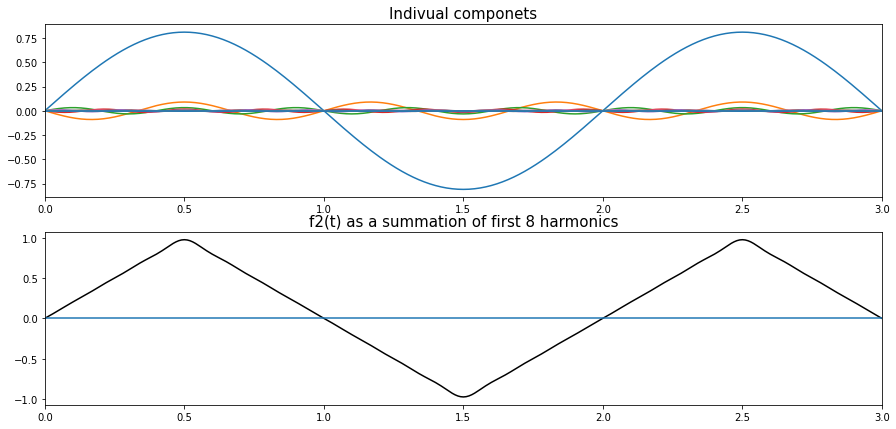

In [7]:
t2=np.linspace(0,50,5000)

f2=[]
for i in range(8):
    f2.append([])
    for t in t2:
        f2[i].append(8*((-1)**i)*np.sin((2*i+1)*np.pi*t)/(((2*i+1)**2)*np.pi**2))
        
plt.figure(figsize=(15,7))
plt.subplot(211)
for i in range(8):
    plt.plot(t2,f2[i])
    plt.axhline(y=0)
    plt.xlim(0,3)
plt.title("Indivual componets",fontsize=15)
        
fn2=f2[0]
for i in range(1,8):
    fn2=np.add(fn2,f2[i])
    
plt.subplot(212)    
plt.plot(t2,fn2,"k")
plt.axhline(y=0)
plt.xlim(0,3)
plt.title("f2(t) as a summation of first 8 harmonics",fontsize=15)
plt.show()

We see that the above plots show how we are nearing the actual wave functions by adding up different sinusoids of varying frequency and amplitude.
Let us see how this approximation works with increase in number of sinusoids (or harmonics) taken in consideration:

In [8]:
t1=np.linspace(0,100,500000)

def rectapp(n):
    for i in range(n):
        f=[]
        for i in range(n):
            f.append([])
            for t in t1:
                f[i].append(4*np.sin((2*i+1)*np.pi*t)/((2*i+1)*np.pi))

    fn=f[0]
    plt.plot(t1,fn,"k")
    plt.axhline(y=0)
    plt.xlim(0,3)
    plt.title("Approximation with 1 frequency component")
    for i in range(1,n):
        fn=np.add(fn,f[i])
        plt.figure(figsize=(7,20))
        plt.subplot(n,1,i+1)
        for j in range(i+1):
            plt.plot(t1,f[j])
        plt.plot(t1,fn,"k")
        plt.axhline(y=0)
        plt.xlim(0,3)
        plt.title("Approximation with "+str(i+1)+" frequency components")

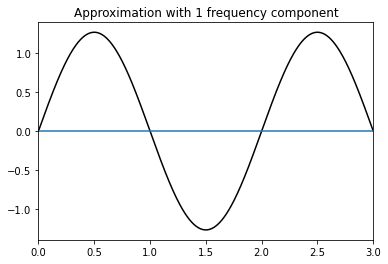

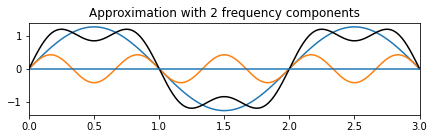

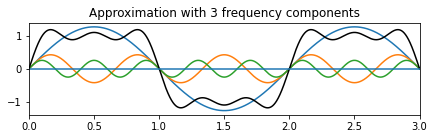

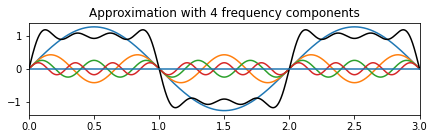

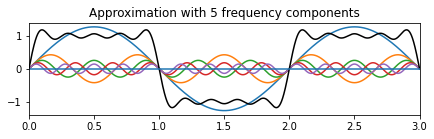

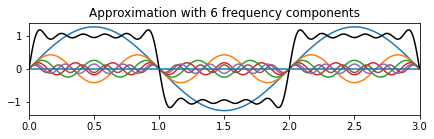

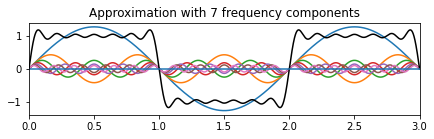

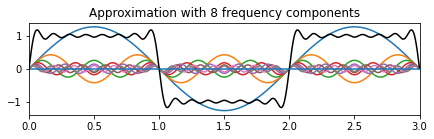

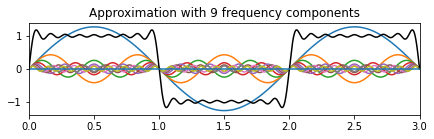

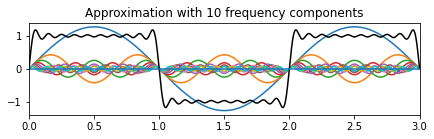

In [9]:
rectapp(10)

In [10]:
def triangapp(n):
    for i in range(n):
        f=[]
        for i in range(n):
            f.append([])
            for t in t1:
                f[i].append(8*((-1)**i)*np.sin((2*i+1)*np.pi*t)/(((2*i+1)**2)*np.pi**2))

    fn=f[0]
    plt.plot(t1,fn,"k")
    plt.axhline(y=0)
    plt.xlim(0,3)
    plt.title("Approximation with 1 frequency component")
    for i in range(1,n):
        fn=np.add(fn,f[i])
        plt.figure(figsize=(7,20))
        plt.subplot(n,1,i+1)
        for j in range(i+1):
            plt.plot(t1,f[j])
        plt.plot(t1,fn,"k")
        plt.axhline(y=0)
        plt.xlim(0,3)
        plt.title("Approximation with "+str(i+1)+" frequency components")
        

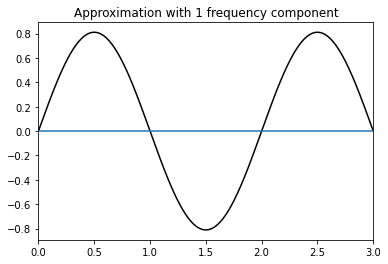

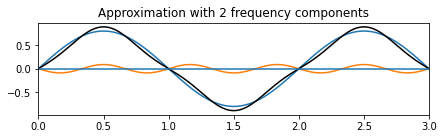

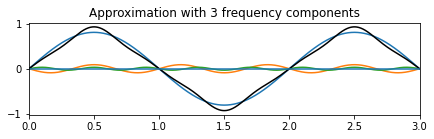

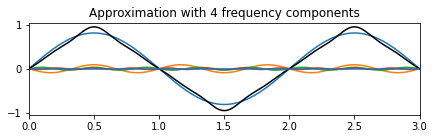

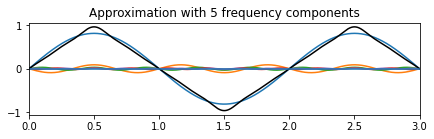

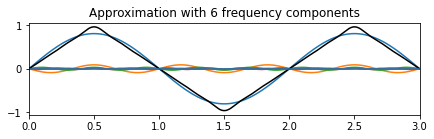

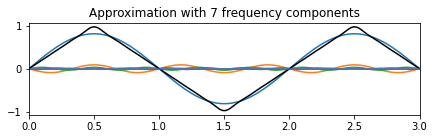

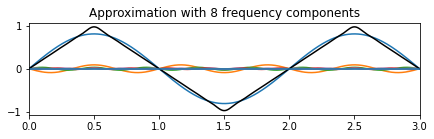

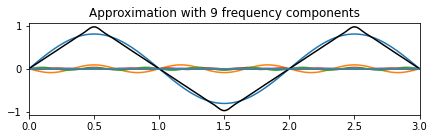

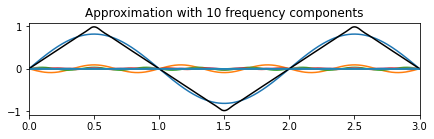

In [11]:
triangapp(10)

Change in values of input to the triangapp() and rectapp() functions is showing us clearly that more the sinusoidal components we take into consideration, better is the approximation of the waveforms. This gives us an intuition that if we take infinitely many sinusoids (theoretically), we'll get the exact waveform.

## Moving on further:

So far we have seen the intuition behind the Fourier transform. Let's get our hands into the mathematics involved in it:
Now, we have two terms at our hand, namely Fourier Series and Fourier Transform. Loosely speaking, **Fourier Series** finds out the components of **periodic signals**, whereas **Fourier Transform** is used for obtaining the components of **non periodic signals** (with finite area under the curve).

Say, $x(t)$ is a continuous non periodic signal and its Fourier transform is represented by $X(\omega)$, then
$$X(\omega)=\int_{-\infty}^{+\infty}x(t)e^{-j\omega t}dt$$ where $j=\sqrt{-1}$,

And if say, z(t) is a periodic function, we get Fourier series of z(t), and the Fourier coefficients, $c_n$ are obtained as $$c_n=(1/T)\int_Tz(t)e^{-jn\omega_0t}dt=(1/T)\int_{-T/2}^{+T/2}z(t)e^{-jn\omega_0t}dt$$

and $$z(t)=\sum_{n=-\infty}^{+\infty}c_ne^{jn\omega_0t}$$

### Signals and dealing with them:
Signals can be anything that carries some information. A sound wave, a photograph, a video, an electromagnetic wave etc. are examples of signals. Difference is in their domain mostly. The domains of these signals can be temporal (time varying signals), spatial (signals varying with position) or both temporal and spatial (eg. videos).

All these signals can be converted into frequency domain using Fourier transform or Fourier series. We'll mostly see the use of Fourier transform as signals that we mostly deal with are non periodic in nature. Moreover, as we're mostly interested in processing those signals and extracting features from them, and this part will be done using our computers, thus the signals are digital in nature, i.e., discrete and quantised.

Having said this, we eliminate the use of continuous Fourier transform in our case, we'll be using **Discrete Fourier Transform (aka DFT)** mostly.

Say, we have two dimensions $x$ and $y$ and a function $f(x,y)$, then its discrete fourier transform is given by

$$F(u,v)=\sum_{m=-\infty}^{+\infty}\sum_{n=-\infty}^{+\infty}f(m,n)e^{-j2\pi(umx_0+vny_0)}$$

$$f(m,n)=(1/UV)\int_0^U\int_0^VF(u,v)e^{j2\pi(umx_0+vny_0)}dudv$$

where, $x_0$ and $y_0$ are the intervals between consecutive samples along $x$ and $y$ axes.

Now, say we're working with an image, then the signal for us will be the pixel values which are varying with position and thus an image is a spatial discrete signal. An image is of finite dimension and thus the limits of m and n will not be $-\infty$ to $\infty$ anymore, rather will be 0 to (M-1) and 0 to (N-1) if the dimension of the image is MxN.

Seeing these expressions one must be wondering how these are helping us in finding the constituent frquency components of the function. Let's take a look at the quantity $e^{-j\omega_0t}$. Well, at a glance this too looks difficult to understand and interpret, so let's scale things down and have a look at $e^{jt}$: On the Argand plane this can be seen as a vector of unit length rotating with angular frequency 1 rad/s in the anti-clockwise direction. These rotating vectors are named **phasors** in mathematics. So this tells us that $e^{-j\omega_0t}$ is a phasor of length 1 unit rotating with frequency $\omega_0$ in the clockwise direction. This phasor is basically a 2D projection of the helix that $e^{-j\omega_0t}$ is representing.

Sounds line a big jump! Where does this helix come from? Let's have a closer look:
$$e^{jt}=cos(t)+jsin(t)$$
Let's take $x=cos(t)$(the real axis) and $y=sin(t)$(the imaginary axis) and $z=t$, then we'll get a helix that is the locus of the point moving forward in $z$ direction with time, while making circular loops perpendicular to the $z$ direction.


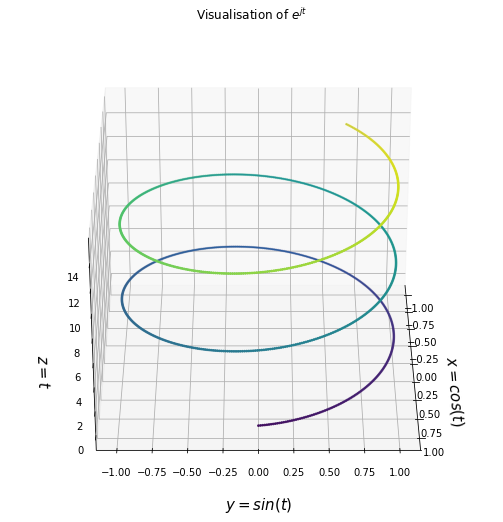

In [12]:
fig = plt.figure(figsize=(9,9))
ax = fig.add_subplot(111, projection='3d')
z = np.linspace(0, 15, 1000)
x = np.cos(z)
y = np.sin(z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

ax.set_xlabel('$x=cos(t)$',fontsize=15,labelpad=15)
ax.set_ylabel('$y=sin(t)$',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
plt.title("Visualisation of $e^{jt}$")

def animate(frame):
    ax.view_init(30, frame)
    plt.pause(.001)
    return fig

anim = animation.FuncAnimation(fig, animate, frames=np.arange(0,360,2), interval=50)
HTML(anim.to_html5_video())

#plt.show()

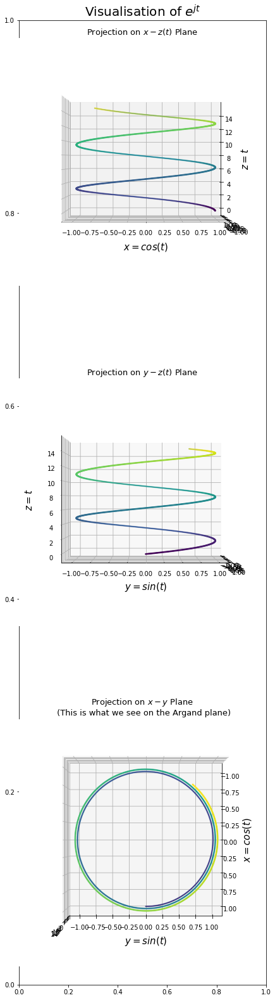

In [13]:
fig = plt.figure(figsize=(7,28))
plt.title("Visualisation of $e^{jt}$",fontsize=20)
ax = fig.add_subplot(311, projection='3d')

z = np.linspace(0, 15, 1000)
x = np.cos(z)
y = np.sin(z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

plt.title("Projection on $x-z(t)$ Plane",fontsize=13)
ax.set_xlabel('$x=cos(t)$',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
ax.view_init(0,270)


ax = fig.add_subplot(312, projection='3d')
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

plt.title("Projection on $y-z(t)$ Plane",fontsize=13)
ax.set_ylabel('$y=sin(t)$',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
ax.view_init(0,0)

ax = fig.add_subplot(313, projection='3d')
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

plt.title("Projection on $x-y$ Plane \n (This is what we see on the Argand plane)",fontsize=13)
ax.set_xlabel('$x=cos(t)$',fontsize=15,labelpad=15)
ax.set_ylabel('$y=sin(t)$',fontsize=15,labelpad=15)
ax.view_init(90,0)

The above figures are to help visualise the term $e^{jt}$, the last circular figure is what we see on an argand plane as the locus of the phasor that we talked about. The projections on the $x-z$ and $y-z$ planes show the two constituent components namely the real one, $cos(t)$ and the imaginary one, $sin(t)$.
So, this two sinusoids (phased out by $90^o$ are forming this Cisoid.)

This visualisation should clearly imply that $e^{-jt}$ is a helix, rotating in just opposite direction.

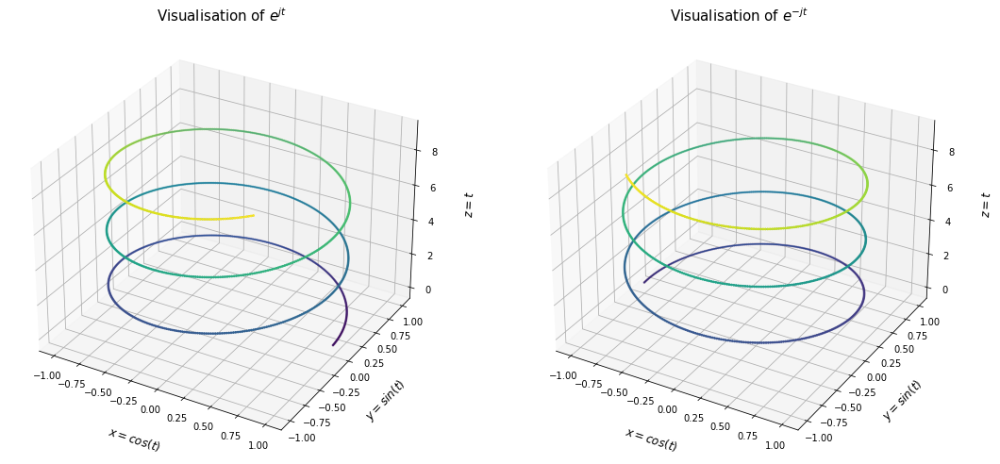

In [14]:
fig = plt.figure(figsize=(18,9))
ax = fig.add_subplot(121, projection='3d')
z = np.linspace(0, 9, 1000)
x = np.cos(2*z)
y = np.sin(2*z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

ax.set_xlabel('$x=cos(t)$',fontsize=12,labelpad=16)
ax.set_ylabel('$y=sin(t)$',fontsize=12,labelpad=16)
ax.set_zlabel('$z=t$',fontsize=12,labelpad=16)
plt.title("Visualisation of $e^{jt}$",fontsize=15)

ax = fig.add_subplot(122, projection='3d')
z = np.linspace(0, 9, 1000)
x = -np.cos(2*z)
y = np.sin(2*z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

ax.set_xlabel('$x=cos(t)$',fontsize=12,labelpad=16)
ax.set_ylabel('$y=sin(t)$',fontsize=12,labelpad=16)
ax.set_zlabel('$z=t$',fontsize=12,labelpad=16)
plt.title("Visualisation of $e^{-jt}$",fontsize=15)
plt.show()

Moving on from $e^{-jt}$ to $e^{-j\omega t}$, with increase in $\omega$ we see a decrease the pitch(distance travelled along z in one time period) of the helix, which also means that the phasor is rotating faster now in $x-y$ plane.

Explanation: if $\omega T$=$2\pi$ (angle swept to complete once cycle), then $T=2\pi/\omega$, i.e the phasor completes one rotation in $2\pi/\omega$ seconds.Thus in one second it completes $1/T$ cycles. So, cycles per second, $f=1/T=\omega/{2\pi}$ Hz.

So, $\omega$ is basically the frequency of rotation of the phasor (radians/sec), in Hertz that would be represented as $f=\omega/{2\pi}$ Hz or cycles per second(cps).

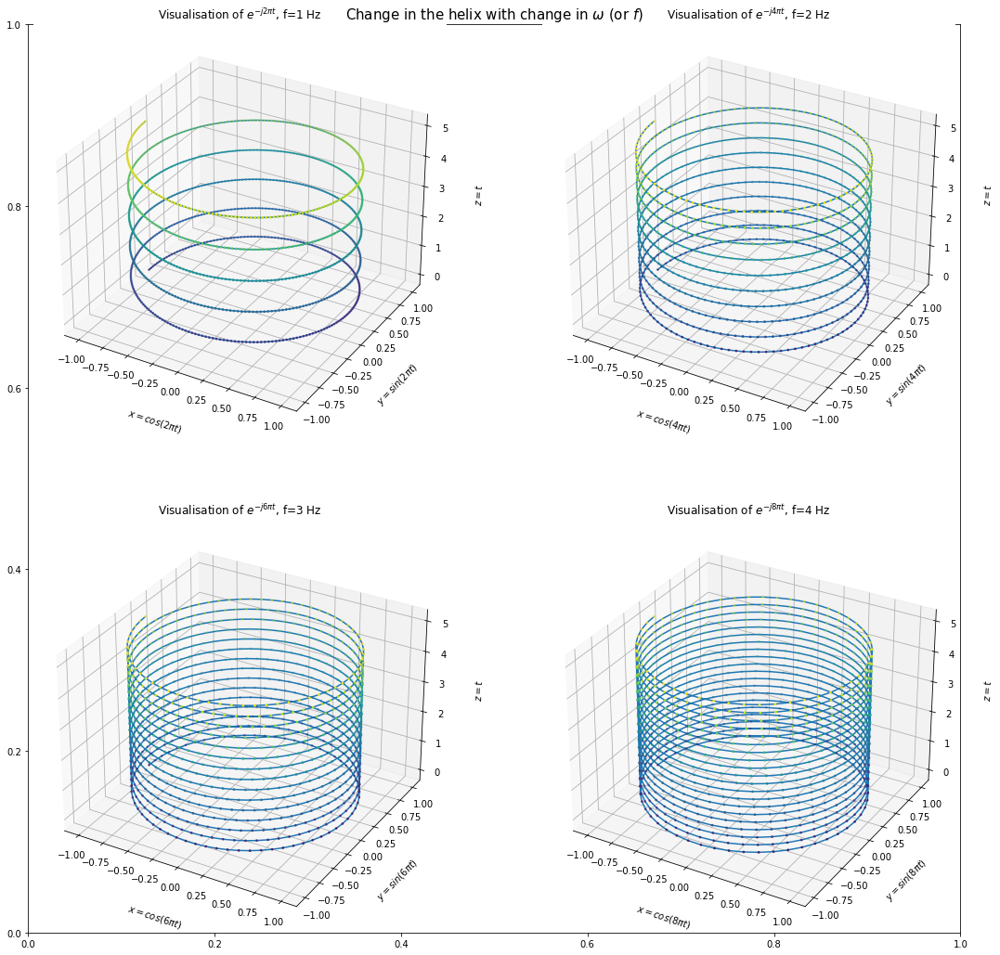

In [15]:
fig = plt.figure(figsize=(18,18))
plt.title("Change in the helix with change in $\omega$ (or $f$)",fontsize=15)
ax = fig.add_subplot(221, projection='3d')
z = np.linspace(0, 5, 1000)
x = -np.cos(2*np.pi*z)
y = np.sin(2*np.pi*z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

ax.set_xlabel('$x=cos(2\pi t)$',labelpad=16)
ax.set_ylabel('$y=sin(2\pi t)$',labelpad=16)
ax.set_zlabel('$z=t$',labelpad=16)
plt.title("Visualisation of $e^{-j2\pi t}$, f=1 Hz")

ax = fig.add_subplot(222, projection='3d')
z = np.linspace(0, 5, 1000)
x = -np.cos(2*np.pi*2*z)
y = np.sin(2*np.pi*2*z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

ax.set_xlabel('$x=cos(4\pi t)$',labelpad=16)
ax.set_ylabel('$y=sin(4\pi t)$',labelpad=16)
ax.set_zlabel('$z=t$',labelpad=16)
plt.title("Visualisation of $e^{-j4\pi t}$, f=2 Hz")

ax = fig.add_subplot(223, projection='3d')
z = np.linspace(0, 5, 1000)
x = -np.cos(2*np.pi*3*z)
y = np.sin(2*np.pi*3*z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

ax.set_xlabel('$x=cos(6\pi t)$',labelpad=16)
ax.set_ylabel('$y=sin(6\pi t)$',labelpad=16)
ax.set_zlabel('$z=t$',labelpad=16)
plt.title("Visualisation of $e^{-j6\pi t}$, f=3 Hz")

ax = fig.add_subplot(224, projection='3d')
z = np.linspace(0, 5, 1000)
x = -np.cos(2*np.pi*4*z)
y = np.sin(2*np.pi*4*z)
ax.plot3D(x,y,z)
ax.scatter3D(x, y, z,c=z,s=3)

ax.set_xlabel('$x=cos(8\pi t)$',labelpad=16)
ax.set_ylabel('$y=sin(8\pi t)$',labelpad=16)
ax.set_zlabel('$z=t$',labelpad=16)
plt.title("Visualisation of $e^{-j8\pi t}$, f=4 Hz")
plt.show()

**Before moving on further with intuitions, we need to explore some more mathematical details:**
1. Visualizing the sinusoids as sum of two phasors rotating in opposite directions.
2. Having an idea about the Dirac Delta function.

1. As $$e^{j\omega t}=cos(\omega t)+jsin(\omega t)$$ and
$$e^{-j\omega t}=cos(\omega t)-jsin(\omega t)$$ we can write $$sin(\omega t)=(e^{j\omega t}-e^{-j\omega t})/2j$$ and $$cos(\omega t)=(e^{j\omega t}+e^{-j\omega t})/2$$
that is both are sums of two phasors rotating in opposite directions (as we have seen the interpretations of $e^{j\omega t}$ and $e^{-j\omega t}$).

2. The Dirac Delta function (aka Impulse function) or $\delta(t)$ is defined as a function that gives infinite value where the input is zero, else zero. And$$\int_{-\infty}^{+\infty}\delta(t)dt=1$$ Now, this is approximated in different ways.
One is given by $$\delta(t)=lim_{a->\infty}sin(at)/{\pi t}=lim_{a->\infty}asin(at)/{\pi at}=lim_{a->\infty}asinc(at)$$ where $$sinc(t)=sin(t)/{\pi t}$$

Let's have a look at how $sinc$ approximation works for the impulse function:

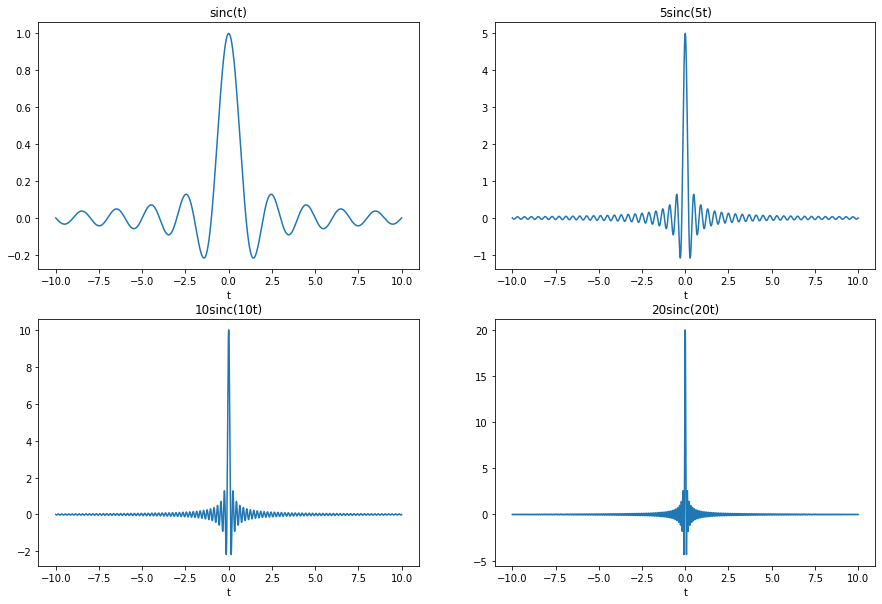

In [16]:
t=np.linspace(-10,10,10000)

plt.figure(figsize=(15,10))

plt.subplot(221)
plt.plot(t,np.sinc(t))
plt.xlabel("t")
plt.title("sinc(t)")

plt.subplot(222)
plt.plot(t,5*np.sinc(5*t))
plt.xlabel("t")
plt.title("5sinc(5t)")

plt.subplot(223)
plt.plot(t,10*np.sinc(10*t))
plt.xlabel("t")
plt.title("10sinc(10t)")

plt.subplot(224)
plt.plot(t,20*np.sinc(20*t))
plt.xlabel("t")
plt.title("20sinc(20t)")

plt.show()

This shows how we near the $\delta(t)$ function with increasing value of $a$.

Why are we discussing this function?
Here's the mathematical clarification:

$$\int_{-\infty}^{+\infty}sin(\omega_0 t)e^{-j\omega t}dt=j\pi(\delta(\omega+\omega_0)-\delta(\omega-\omega_0))$$

of which if we plot the magnitude, looks like as shown below (when $\omega_0=5 rad/s$):

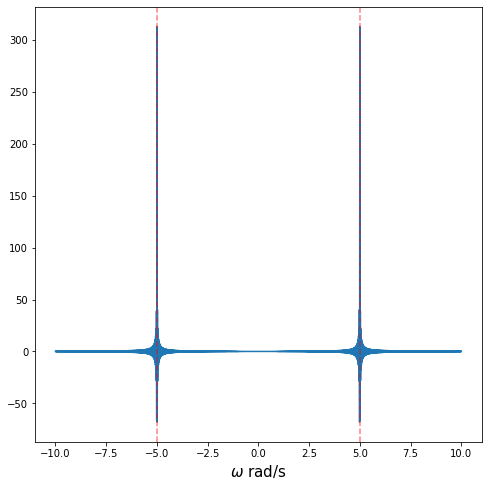

In [17]:
t=np.linspace(-10,10,10000)
plt.figure(figsize=(8,8))
y=100*np.pi*(np.sinc(100*(t-5))+np.sinc(100*(t+5)))
plt.plot(t,y)
xc=[-5,5]
for xl in xc:
    plt.axvline(x=xl,color="red",ls="--",alpha=0.5)
plt.xlabel("$\omega$ rad/s",fontsize=15)
plt.show()

This shows two peaks at $5 rad/s$ and $-5 rad/s$.
The negative value indicates the existence of a phasor rotating in clockwise direction, while the positive one indicates the existence of a phasor rotating in anti-clockwise direction, i.e. we are getting the frequencies of the constituent phasors of $sin(5t)$.

And this tells us why and how we are getting the constituent frequencies of a function $x(t)$ when we perform $$\int_{-\infty}^{+\infty}x(t)e^{-j\omega t}dt$$ This is because we have already seen that any $x(t)$ (signal or function) can be expressed as a sum of some (or infinitely many) sinusoids, and the operation gives us peaks at the frequencies of the constituent sinusoids.

Getting back to our initial sample function $f(t)=5\sin(t)+2\sin(2t)+6\sin(3t)$, we'll get something like the figure shown below when it is examined in frequency domain:

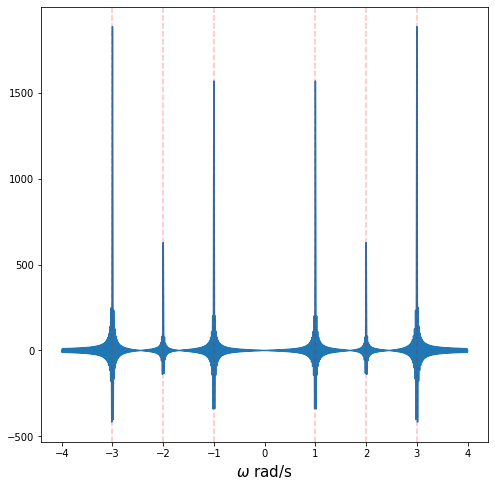

In [18]:
t=np.linspace(-4,4,10000)
plt.figure(figsize=(8,8))
y=5*100*np.pi*(np.sinc(100*(t-1))+np.sinc(100*(t+1)))+2*100*np.pi*(np.sinc(100*(t-2))+np.sinc(100*(t+2)))+6*100*np.pi*(np.sinc(100*(t-3))+np.sinc(100*(t+3)))
plt.plot(t,y)
xc=[-3,-2,-1,1,2,3]
for xl in xc:
    plt.axvline(x=xl,color="red",ls="--",alpha=0.25)
plt.xlabel("$\omega$ rad/s",fontsize=15)
plt.show()

So in frequency domain we get peaks at $\omega$=$-3, -2, -1, 1, 2, 3$ $rad/s$, which is pretty obvious to us by now!

So this clearly shows how we recognise the frequencies of the constituent sinusoids with the operation $$\int_{-\infty}^{+\infty}x(t)e^{-j\omega t}dt$$
**Now, we need to talk about how the phase information is extracted from the same thing:**

As $e^{-j\omega t}=cos(\omega t)-jsin(\omega t)$, whenever we multiply this with $sin(\omega_0t)$ we get $sin(\omega_0t)cos(\omega t)-jsin(\omega_0t)sin(\omega t)$. Now whatever be the $\omega$. the first part on integrating becomes 0, the second part (i.e. the imaginary part) remains though and gives a peak at $\omega=\omega_0$.

And when multiplied by $cos(\omega_0t)$, the real part gives a peak at $\omega=\omega_0$ and the imaginary part vanishes.

Now, say we have a signal $x(t)=acos(\omega_0t)+bsin(\omega_0t)$ (notice, this is one frequency component only), which can be written as $\sqrt{a^2+b^2}cos(\omega_0t-\phi)$, where $\phi=tan^{-1}(b/a)$. And we call this $\phi$ the phase of the signal, and $\sqrt{a^2+b^2}$ the magnitude. ($(b/\sqrt{a^2+b^2})=sin(\phi)$ and ($a/\sqrt{a^2+b^2})=cos(\phi)$)

Now multiplying this with $e^{-j\omega t}$ and integrating gives us a real component corresponding to the $acos(\omega_0 t)$ term and an imaginary component corresponding to the $bsin(\omega_0t)$ term. Thus we get the phase using $tan^{-1}(b/a)$.

**Lets have a look at the images below:**

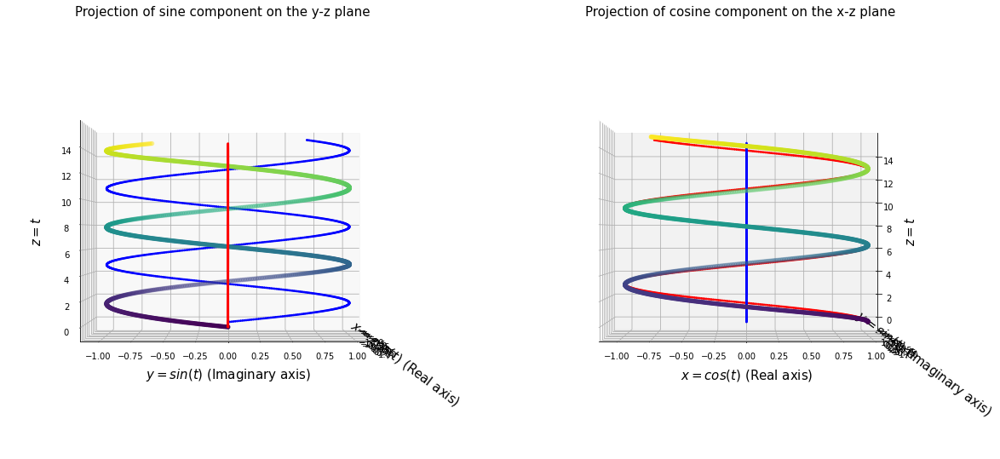

In [19]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(121, projection='3d')
z = np.linspace(0, 15, 1000)
x = np.cos(z)
y = -np.sin(z)
x1=np.cos(z)
y1=0
x2=0
y2=np.sin(z)
ax.scatter3D(x,y,z,c=z)
ax.scatter3D(x1, y1, z,c='r',s=3)
ax.scatter3D(x2, y2, z,c='b',s=3)
ax.set_xlabel('$x=cos(t)$ (Real axis)',fontsize=15,labelpad=15)
ax.set_ylabel('$y=sin(t)$ (Imaginary axis)',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
plt.title("Projection of sine component on the y-z plane",fontsize=15)
ax.view_init(0, 0)

ax = fig.add_subplot(122, projection='3d')
z = np.linspace(0, 15, 1000)
x = np.cos(z)
y = -np.sin(z)
x1=np.cos(z)
y1=0
x2=0
y2=np.sin(z)
ax.scatter3D(x,y,z,c=z)
ax.scatter3D(x1, y1, z,c='r',s=3)
ax.scatter3D(x2, y2, z,c='b',s=3)
ax.set_xlabel('$x=cos(t)$ (Real axis)',fontsize=15,labelpad=15)
ax.set_ylabel('$y=sin(t)$ (Imaginary axis)',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
plt.title("Projection of cosine component on the x-z plane",fontsize=15)
ax.view_init(0, 270)

This clearly shows that the cosine part of a signal has no component along the imaginary axis and the sine part has no component along the real axis.
Let's say we have a cosine component with phase $\pi/6$: $$cos(\omega_0t+\pi/6)=cos(\omega_0t)cos(\pi/6)-sin(\omega_0t)sin(\pi/6)$$

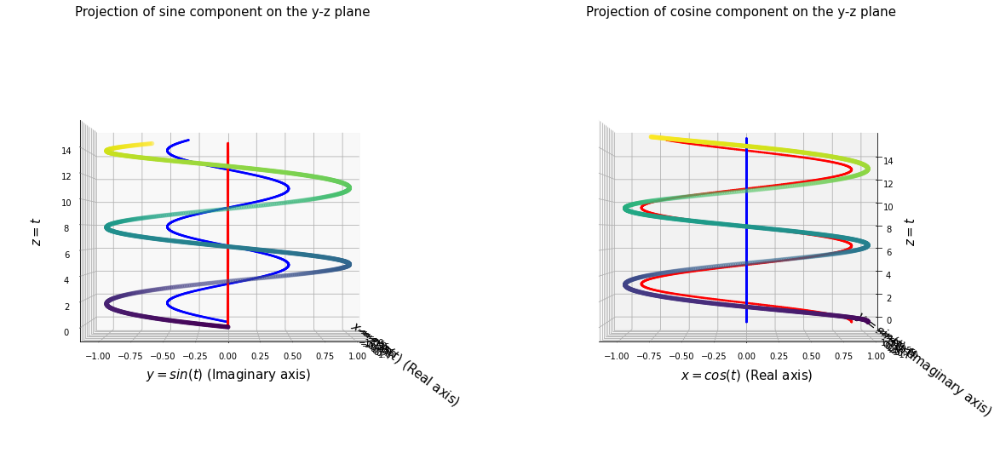

In [20]:
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(121, projection='3d')
z = np.linspace(0, 15, 1000)
x = np.cos(z)
y = -np.sin(z)
x1=np.cos(np.pi/6)*np.cos(z)
y1=0
x2=0
y2=-np.sin(np.pi/6)*np.sin(z)
ax.scatter3D(x,y,z,c=z)
ax.scatter3D(x1, y1, z,c='r',s=3)
ax.scatter3D(x2, y2, z,c='b',s=3)
ax.set_xlabel('$x=cos(t)$ (Real axis)',fontsize=15,labelpad=15)
ax.set_ylabel('$y=sin(t)$ (Imaginary axis)',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
plt.title("Projection of sine component on the y-z plane",fontsize=15)
ax.view_init(0, 0)

ax = fig.add_subplot(122, projection='3d')
z = np.linspace(0, 15, 1000)
x = np.cos(z)
y = -np.sin(z)
x1=np.cos(np.pi/6)*np.cos(z)
y1=0
x2=0
y2=-np.sin(np.pi/6)*np.sin(z)
ax.scatter3D(x,y,z,c=z)
ax.scatter3D(x1, y1, z,c='r',s=3)
ax.scatter3D(x2, y2, z,c='b',s=3)
ax.set_xlabel('$x=cos(t)$ (Real axis)',fontsize=15,labelpad=15)
ax.set_ylabel('$y=sin(t)$ (Imaginary axis)',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
plt.title("Projection of cosine component on the y-z plane",fontsize=15)
ax.view_init(0, 270)

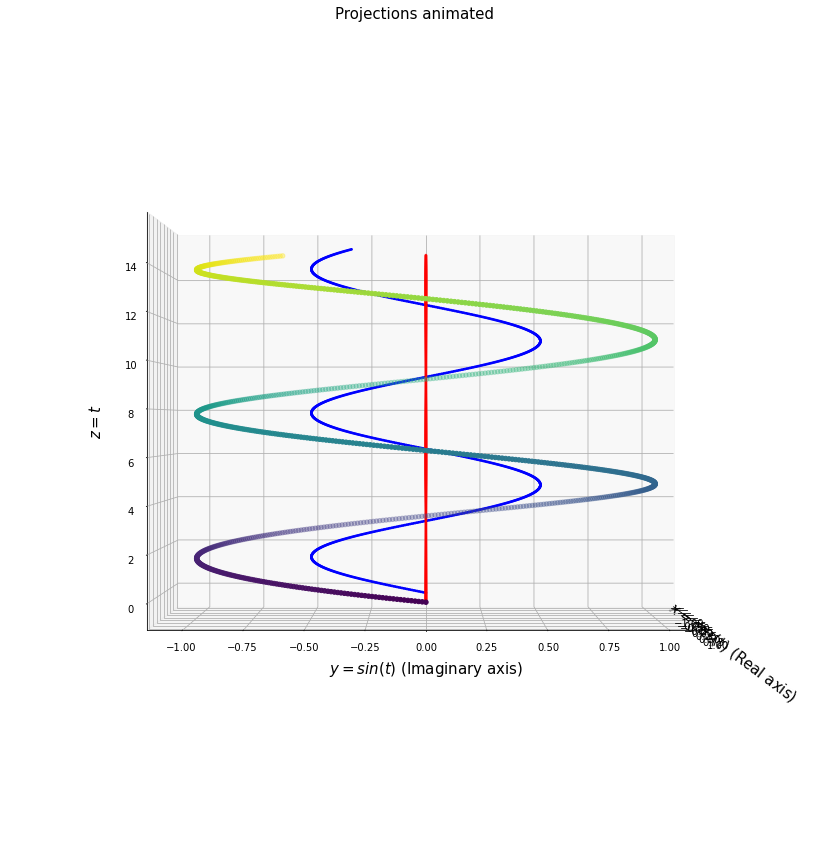

In [21]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
z = np.linspace(0, 15, 1000)
x = np.cos(z)
y = -np.sin(z)
x1=np.cos(np.pi/6)*np.cos(z)
y1=0
x2=0
y2=-np.sin(np.pi/6)*np.sin(z)
ax.scatter3D(x,y,z,c=z)
ax.scatter3D(x1, y1, z,c='r',s=3)
ax.scatter3D(x2, y2, z,c='b',s=3)
ax.set_xlabel('$x=cos(t)$ (Real axis)',fontsize=15,labelpad=15)
ax.set_ylabel('$y=sin(t)$ (Imaginary axis)',fontsize=15,labelpad=15)
ax.set_zlabel('$z=t$',fontsize=15,labelpad=15)
plt.title("Projections animated",fontsize=15)

def animate(frame):
    ax.view_init(0, frame)
    plt.pause(.1)
    return fig

anim = animation.FuncAnimation(fig, animate, frames=750, interval=50)
HTML(anim.to_html5_video())

## The importance: Interplay of domains

Our signal as we said can be temporal or spatial or a combination of both. In all the cases we can and need to analyse and play with their frequency characteristics. This interplay of domains is facilitated by Fourier transform. Here lies the importance of this enormously powerful tool.

**Fourier transform on images**

An image is made up of pixels having different values distributed in 1 or 3 (grayscale or RGB) channels. So, images can be interpreted as 2D digital signals and we can find out the frequencies presented in an image using FFT. (Here obviously we use the **Discrete Fourier Transform**)

In [22]:
image1=np.zeros((100,100))
image2=np.zeros((100,100))
for i in range(5):
    image1[10*2*i:10*(2*i+1),:]=1
for i in range(5):
    image2[:,10*2*i:10*(2*i+1)]=1

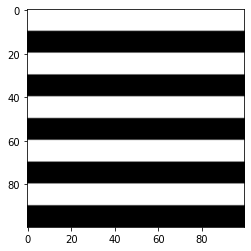

In [23]:
plt.imshow(image1,cmap="gray")
plt.show()

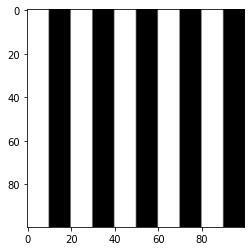

In [24]:
plt.imshow(image2,cmap="gray")
plt.show()

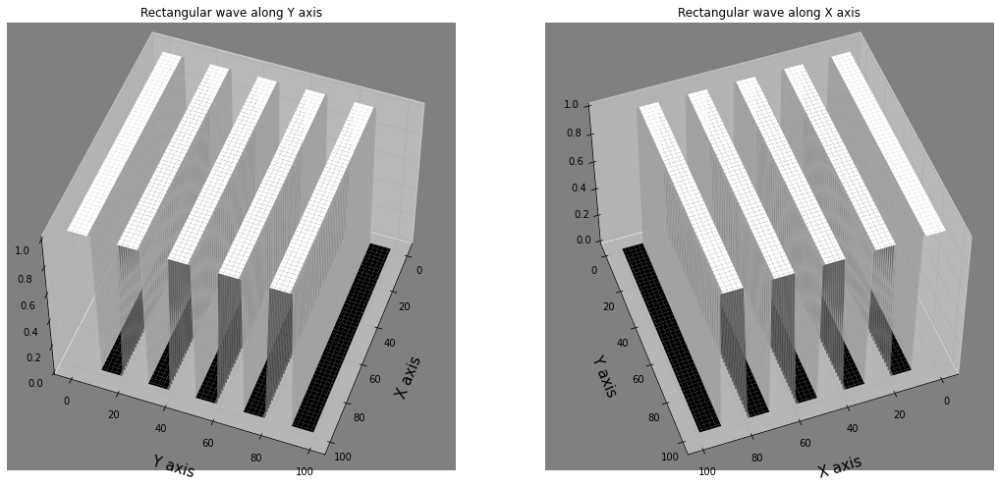

In [25]:
# for the surface map
fig = plt.figure(figsize=(18,18))
ax = fig.add_subplot(121, projection='3d')
y = range( image1.shape[0] )
x = range( image1.shape[1] ) 
X, Y = np.meshgrid(x, y)
ax.set_facecolor('gray') 
ax.set_xlabel('X axis',fontsize=15,labelpad=15)
ax.set_ylabel('Y axis',fontsize=15,labelpad=15)
plt.title("Rectangular wave along Y axis")
ax.plot_surface( X, Y, image1[:,:], cmap=plt.cm.gray,
        linewidth=0) 
ax.view_init(azim=20, elev=50)

ax = fig.add_subplot(122, projection='3d')
y = range( image2.shape[0] )
x = range( image2.shape[1] ) 
X, Y = np.meshgrid(x, y)
ax.set_facecolor('gray') 
ax.set_xlabel('X axis',fontsize=15,labelpad=15)
ax.set_ylabel('Y axis',fontsize=15,labelpad=15)
plt.title("Rectangular wave along X axis")
ax.plot_surface( X, Y, image2[:,:], cmap=plt.cm.gray,
        linewidth=0) 
ax.view_init(azim=70, elev=50)
plt.show()

As the images above show, one image is a rectangular wave along the Y axis, the other is a rectangular wave along the X axis. And we have seen how a rectangular wave is made up of different frequency components. The difference is just that, here the domain is spatial instead of temporal.

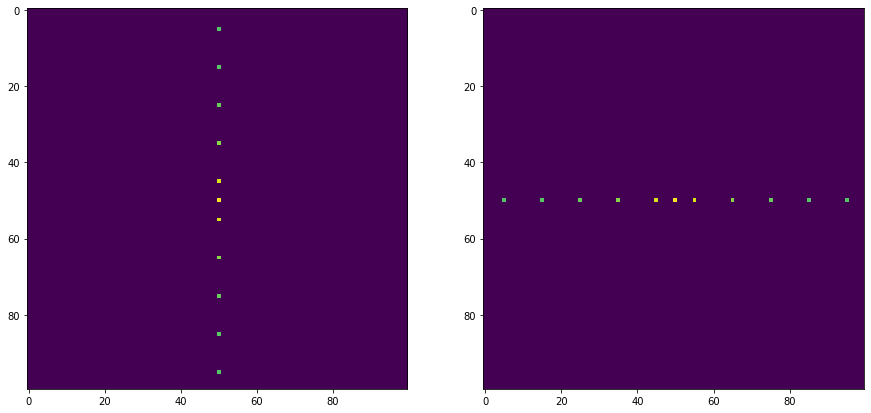

In [26]:
Yd = np.fft.fftshift(np.fft.fft2(image1))
Yf = np.log(1 + np.abs(Yd))

Xd=np.fft.fftshift(np.fft.fft2(image2))
Xf = np.log(1 + np.abs(Xd))

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(121)
plt.imshow(Yf)

ax = fig.add_subplot(122)
plt.imshow(Xf)
plt.show()

The two figures above show that the first image has different frequency components along the Y axis but nothing along the X axis and vice versa for the second one.
The result seems pretty obvious, right? In the first image, we had no variation of pixel values along the X axis, which means, the only frequency component along X must be the zero frequency component (or the DC component). The axes interchange for the second image.

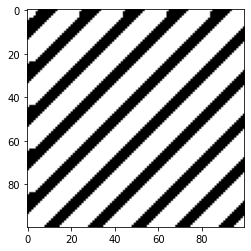

In [27]:
image3=np.zeros((100,100))
for i in range(image3.shape[0]):
    cv2.line(image3,(0,20*i),(20*i,0),1,7)
plt.imshow(image3,'gray')

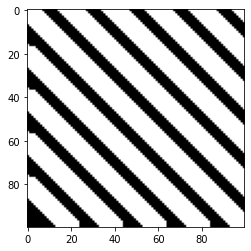

In [28]:
image4=np.zeros((100,100))
for i in range(image4.shape[0]):
    cv2.line(image4,(0,80-20*i),(20+20*i,100),1,7)
plt.imshow(image4,'gray')

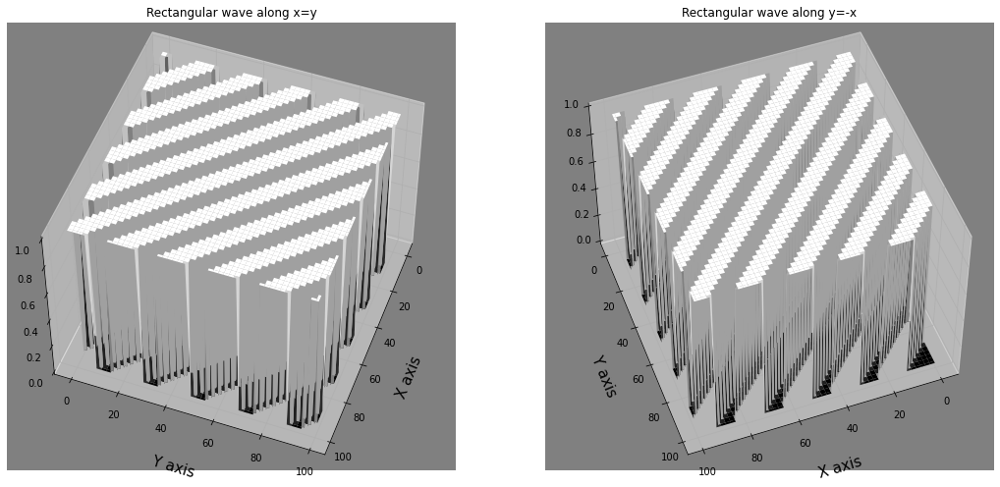

In [29]:
# for the surface map
fig = plt.figure(figsize=(18,18))
ax = fig.add_subplot(121, projection='3d')
y = range( image3.shape[0] )
x = range( image3.shape[1] ) 
X, Y = np.meshgrid(x, y)
ax.set_facecolor('gray') 
ax.set_xlabel('X axis',fontsize=15,labelpad=15)
ax.set_ylabel('Y axis',fontsize=15,labelpad=15)
plt.title("Rectangular wave along x=y")
ax.plot_surface( X, Y, image3[:,:], cmap=plt.cm.gray,
        linewidth=0) 
ax.view_init(azim=20, elev=50)

ax = fig.add_subplot(122, projection='3d')
y = range( image4.shape[0] )
x = range( image4.shape[1] ) 
X, Y = np.meshgrid(x, y)
ax.set_facecolor('gray') 
ax.set_xlabel('X axis',fontsize=15,labelpad=15)
ax.set_ylabel('Y axis',fontsize=15,labelpad=15)
plt.title("Rectangular wave along y=-x")
ax.plot_surface( X, Y, image4[:,:], cmap=plt.cm.gray,
        linewidth=0) 
ax.view_init(azim=70, elev=50)
plt.show()

Now these images above show, one image is a rectangular wave along the Y=X line, the other is a rectangular wave along the Y=-X line. (Well, these are not perfect rectangular waves though)
So, let's have a look at how they look in frequency domain:

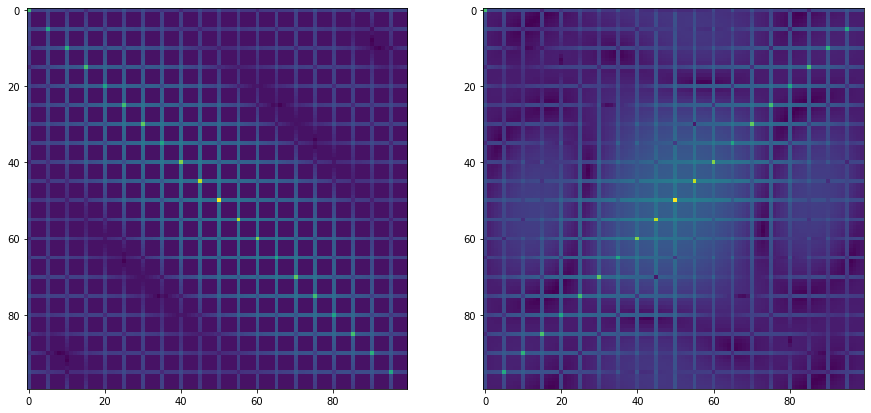

In [30]:
image3d = np.fft.fftshift(np.fft.fft2(image3))
image3f = np.log(1 + np.abs(image3d))

image4d=np.fft.fftshift(np.fft.fft2(image4))
image4f = np.log(1 + np.abs(image4d))

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(121)
plt.imshow(image3f)

ax = fig.add_subplot(122)
plt.imshow(image4f)
plt.show()

In [31]:
image3blur=cv2.GaussianBlur(image3,(9,9),50)
image4blur=cv2.GaussianBlur(image4,(9,9),50)

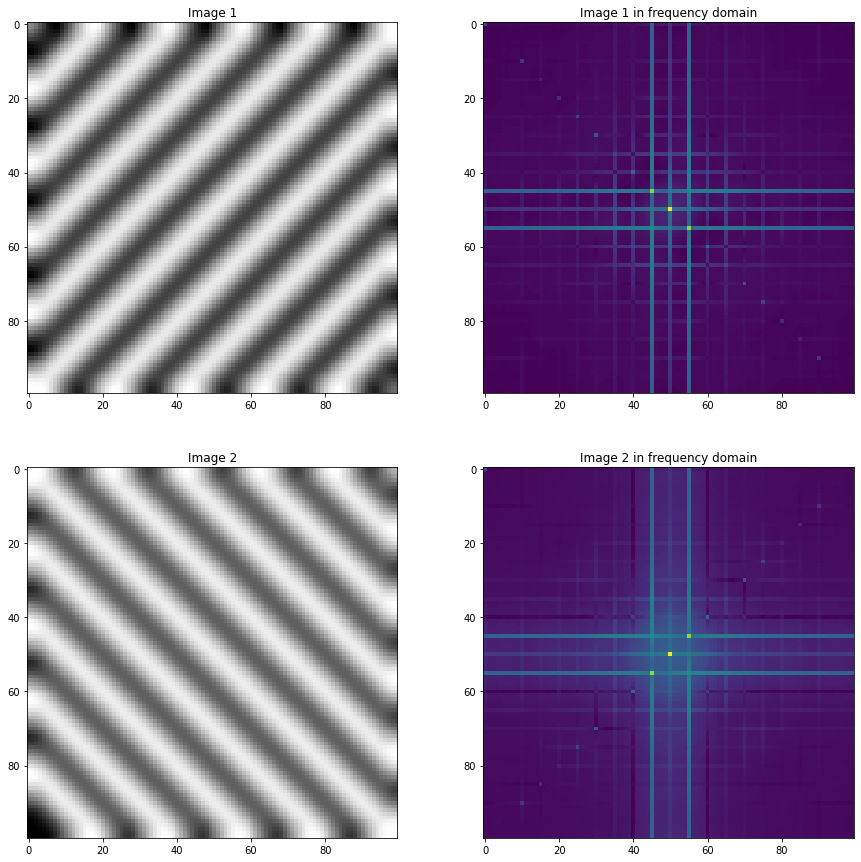

In [32]:
image3bd = np.fft.fftshift(np.fft.fft2(image3blur))
image3bf = np.log(1 + np.abs(image3bd))

image4bd = np.fft.fftshift(np.fft.fft2(image4blur))
image4bf = np.log(1 + np.abs(image4bd))


fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(221)
plt.imshow(image3blur,"gray")
plt.title("Image 1")

ax = fig.add_subplot(222)
plt.imshow(image3bf)
plt.title("Image 1 in frequency domain")

ax = fig.add_subplot(223)
plt.imshow(image4blur,"gray")
plt.title("Image 2")

ax = fig.add_subplot(224)
plt.imshow(image4bf)
plt.title("Image 2 in frequency domain")
plt.show()

The images above show how the distribution in frequency domain changes with the alignment of edges in an image.
This should give us a clear idea about how we get into frequency domain from pixel values of an image.

**Here we wrap up this notebook with the basic understanding and motivation of Fourier Transform**.

Would be happy to dive deeper into this.